### Zadania

Główna część listy (zadania 1-3) dotyczy detekcji krawędzi na obrazach. Zadanie 4 kontynuuje temat binaryzacji, skupiając się na operacjach globalnych (przekształceniach histogramu).

In [1]:
import cv2
import numpy as np
from PIL import Image

In [2]:
from lab2_utils import (
    display_gradient,
    plot_horizontal_comparison,
    plot_histograms,
    analyze_otsu_transformation,
)

##### Zad. 1: Wyznaczenie gradientów

Wykonaj dla obrazu `coins` sztuczny obraz ilustrujący wielkość (moduł) wektora gradientu w danym punkcie. Do wyświetlenia użyj [mapy kolorów](https://matplotlib.org/stable/tutorials/colors/colormaps.html) `hot` do oznaczenia wielkości gradientu odpowiednim kolorem – im większa wartość, tym jaśniej (_mapa ciepła_).  
Gdzie gradienty są bliskie zera?  
Czy uzyskany wynik pozwoliłby np. na detekcję obiektów?

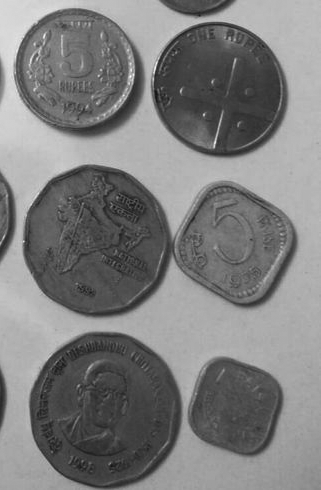

In [13]:
coins = cv2.imread("dane/Monety_szare.bmp", cv2.IMREAD_GRAYSCALE)
Image.fromarray(coins)

Rozwiązanie:

## Rozwiązanie pięknym pythonem

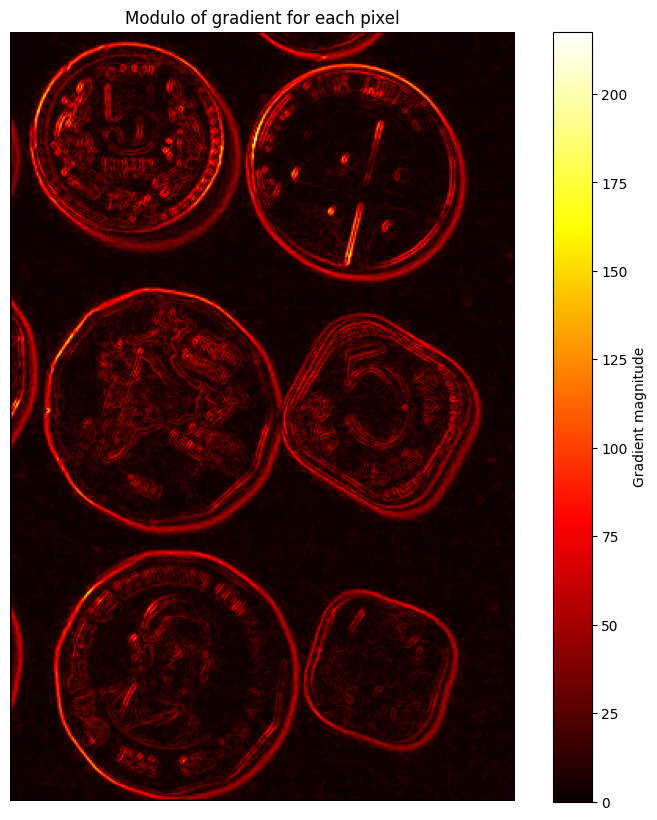

In [19]:
x_size, y_size = coins.shape
gradient_magnitude = np.zeros((x_size, y_size), dtype=np.float64)
coins = coins.astype(np.float64)

for x in range(1, x_size - 1):
    for y in range(1, y_size - 1):
        gx = coins[x + 1, y] - coins[x - 1, y]
        gy = coins[x, y + 1] - coins[x, y - 1]
        gradient_magnitude[x, y] = np.sqrt(gx**2 + gy**2)

display_gradient(gradient_magnitude)

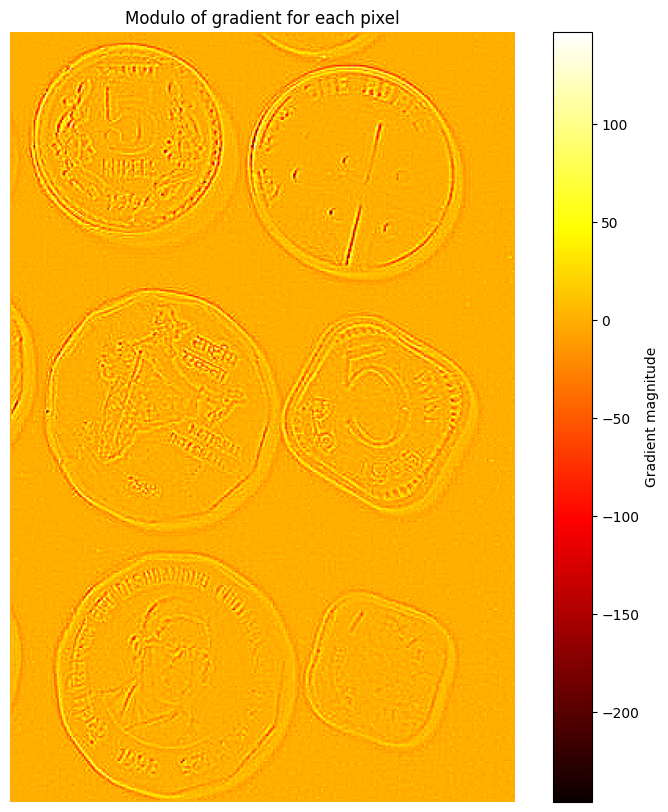

In [20]:
x_size, y_size = coins.shape
gradient_magnitude = np.zeros((x_size, y_size), dtype=np.float64)

for x in range(1, x_size - 1):
    for y in range(1, y_size - 1):
        gx = coins[x + 1, y] + coins[x - 1, y] - 2 * coins[x, y]
        gy = coins[x, y + 1] + coins[x, y - 1] - 2 * coins[x, y]
        gradient_magnitude[x, y] = gx + gy

display_gradient(gradient_magnitude)

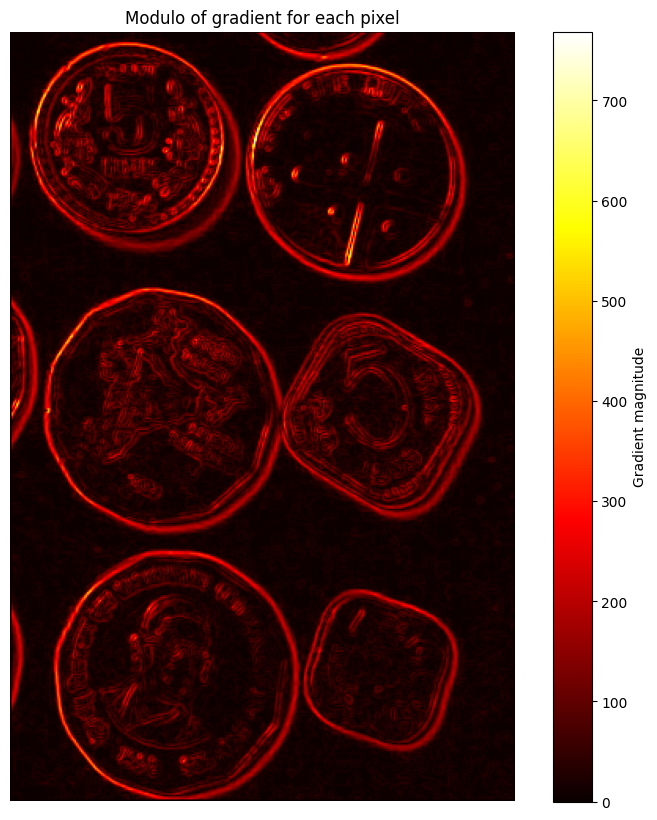

In [21]:
kernel_x = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]], dtype=np.float64)

kernel_y = np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]], dtype=np.float64)

x_size, y_size = coins.shape
gradient_magnitude = np.zeros((x_size, y_size), dtype=np.float64)

for x in range(1, x_size - 1):
    for y in range(1, y_size - 1):
        gx = np.sum(kernel_x * coins[x - 1 : x + 2, y - 1 : y + 2])
        gy = np.sum(kernel_y * coins[x - 1 : x + 2, y - 1 : y + 2])
        gradient_magnitude[x, y] = np.sqrt(gx**2 + gy**2)

display_gradient(gradient_magnitude)

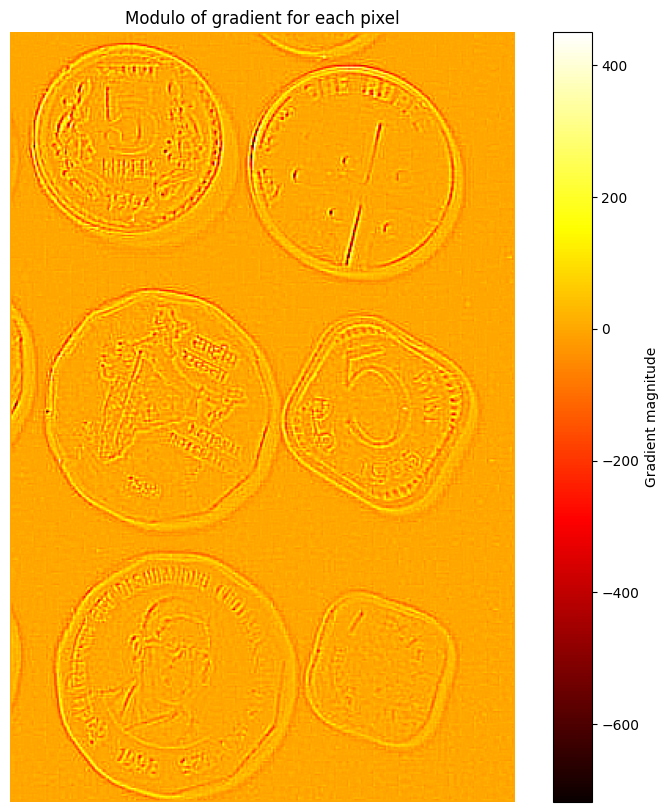

In [22]:
kernel_x = np.array([[1, -2, 1], [2, -4, 2], [1, -2, 1]], dtype=np.float64)

kernel_y = np.array([[1, 2, 1], [-2, -4, -2], [1, 2, 1]], dtype=np.float64)

x_size, y_size = coins.shape
gradient_magnitude = np.zeros((x_size, y_size), dtype=np.float64)

for x in range(1, x_size - 1):
    for y in range(1, y_size - 1):
        gx = np.sum(kernel_x * coins[x - 1 : x + 2, y - 1 : y + 2])
        gy = np.sum(kernel_y * coins[x - 1 : x + 2, y - 1 : y + 2])
        gradient_magnitude[x, y] = gx + gy

display_gradient(gradient_magnitude)

## Rzowiązanie CV2

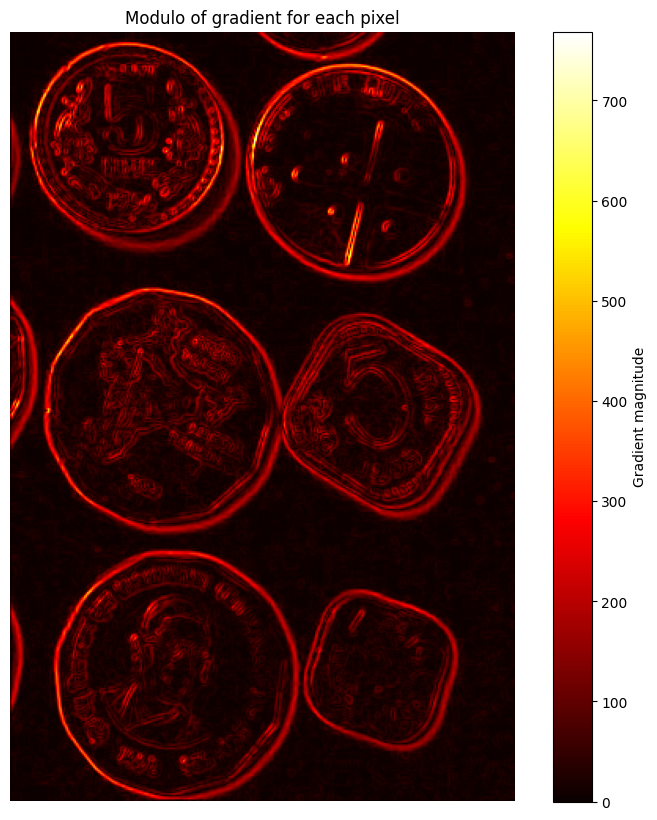

In [8]:
sobel_x = cv2.Sobel(coins, cv2.CV_64F, 1, 0, ksize=3)
sobel_y = cv2.Sobel(coins, cv2.CV_64F, 0, 1, ksize=3)
gradient_magnitude = cv2.magnitude(sobel_x, sobel_y)

display_gradient(gradient_magnitude)

---

##### Zad. 2: Detekcja krawędzi

Przeprowadź z obrazem `coins_noise` takie przekształcenia, aby zmaksymalizować możliwość rozpoznania obiektów. Wykorzystaj [filtr Canny'ego](https://docs.opencv.org/4.x/dd/d1a/group__imgproc__feature.html#ga04723e007ed888ddf11d9ba04e2232de) do detekcji krawędzi; zbadaj jego zachowanie w zależności od wartości **progów** oraz sposobu redukcji **szumu**.

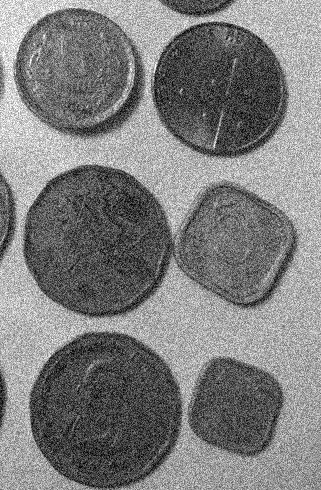

In [9]:
coins_noise = cv2.imread("dane/Monety_szare_szum.bmp", cv2.IMREAD_GRAYSCALE)
Image.fromarray(coins_noise)

Rozwiązanie:

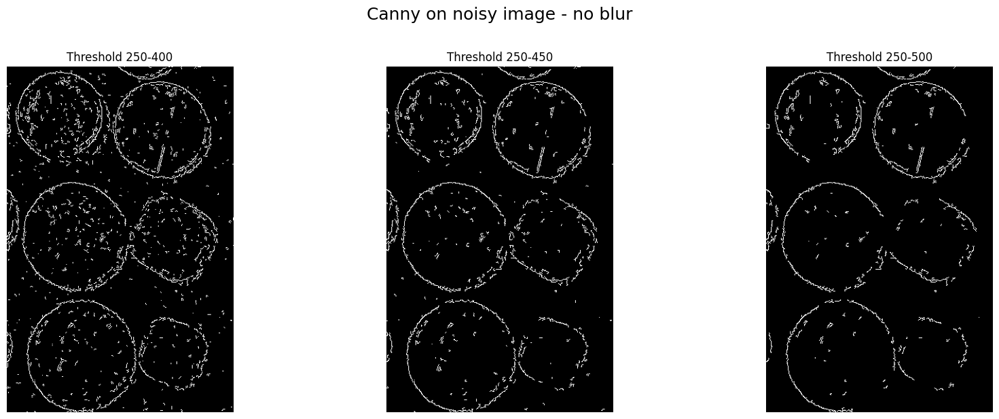

In [10]:
canny_no_blur_low_thresh = cv2.Canny(coins_noise, 250, 400)
canny_no_blur = cv2.Canny(coins_noise, 250, 450)
canny_no_blur_high_thresh = cv2.Canny(coins_noise, 250, 500)

plot_horizontal_comparison(
    canny_no_blur_low_thresh,
    canny_no_blur,
    canny_no_blur_high_thresh,
    "Canny on noisy image - no blur",
    ["Threshold 250-400", "Threshold 250-450", "Threshold 250-500"],
)

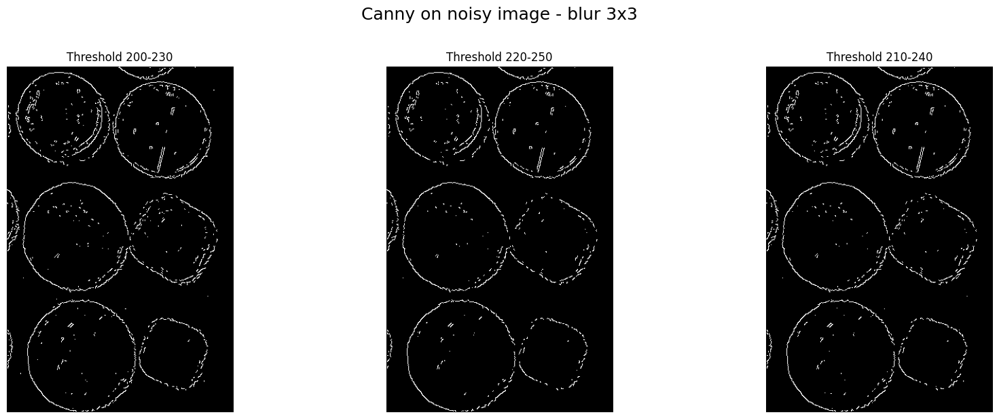

In [11]:
blur_3x3 = cv2.GaussianBlur(coins_noise, (3, 3), 0)
canny_blur_3x3_low_thresh = cv2.Canny(blur_3x3, 200, 230)
canny_blur_3x3 = cv2.Canny(blur_3x3, 220, 250)
canny_blur_3x3_high_thresh = cv2.Canny(blur_3x3, 210, 240)

plot_horizontal_comparison(
    canny_blur_3x3_low_thresh,
    canny_blur_3x3,
    canny_blur_3x3_high_thresh,
    "Canny on noisy image - blur 3x3",
    ["Threshold 200-230", "Threshold 220-250", "Threshold 210-240"],
)

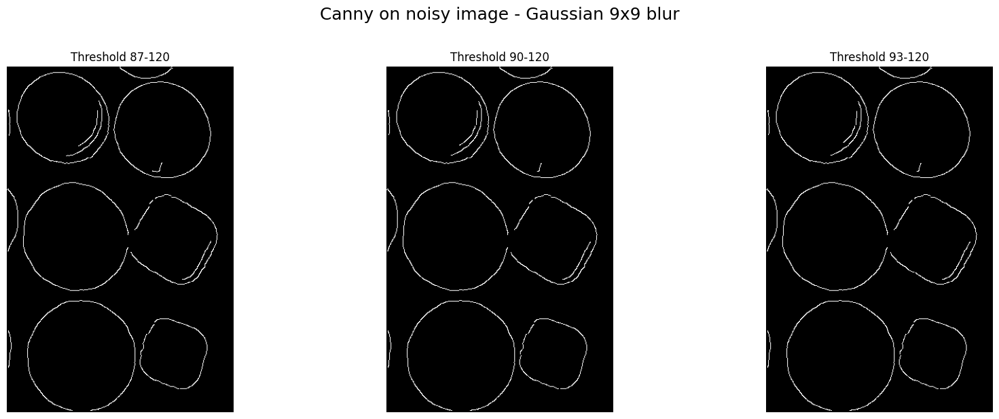

In [12]:
blur_9x9 = cv2.GaussianBlur(coins_noise, (13, 13), 0)
canny_blur_9x9_low_thresh = cv2.Canny(blur_9x9, 87, 120)
canny_blur_9x9 = cv2.Canny(blur_9x9, 90, 120)
canny_blur_9x9_high_thresh = cv2.Canny(blur_9x9, 93, 120)

plot_horizontal_comparison(
    canny_blur_9x9_low_thresh,
    canny_blur_9x9,
    canny_blur_9x9_high_thresh,
    "Canny on noisy image - Gaussian 9x9 blur",
    ["Threshold 87-120", "Threshold 90-120", "Threshold 93-120"],
)

---

##### Zad. 3: Wyrównanie histogramu

Wyrównaj histogram obrazu `coins_noise`. Wyniki zaprezentuj za pomocą obrazów i towarzyszących im histogramów. Powtórz eksperyment z detekcją krawędzi (zad 2) dla wyrównanego obrazu i omów różnice.

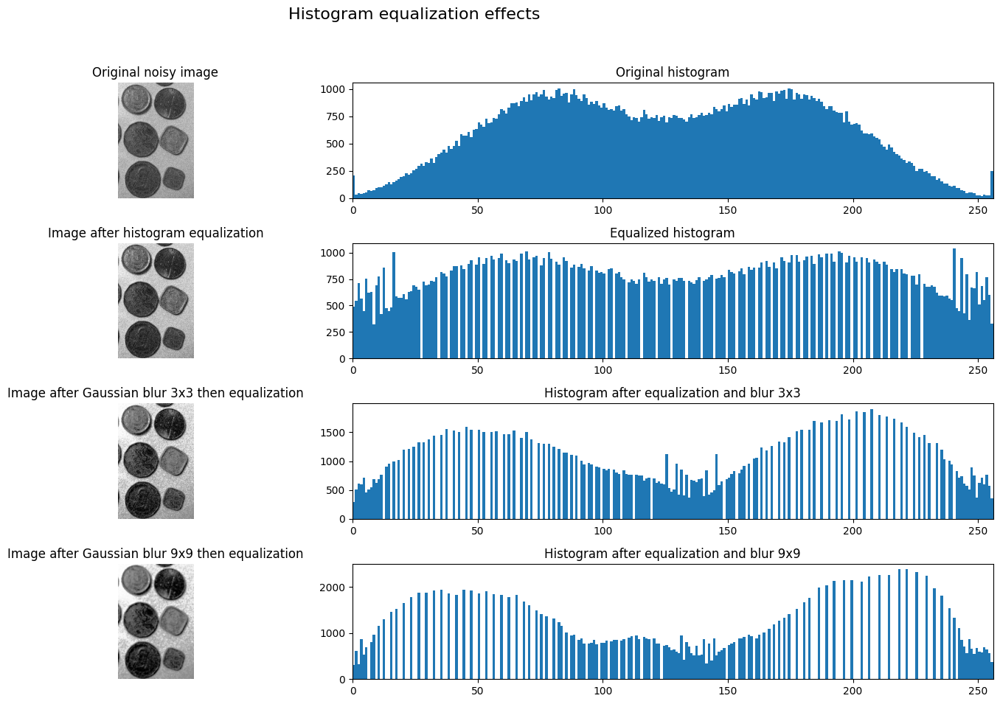

In [13]:
coins_equalized = cv2.equalizeHist(coins_noise)
coins_blured_3x3_equalized = cv2.equalizeHist(cv2.GaussianBlur(coins_noise, (3, 3), 0))
coins_blured_9x9_equalized = cv2.equalizeHist(cv2.GaussianBlur(coins_noise, (9, 9), 0))

plot_histograms(
    coins_noise,
    coins_equalized,
    coins_blured_3x3_equalized,
    coins_blured_9x9_equalized,
)

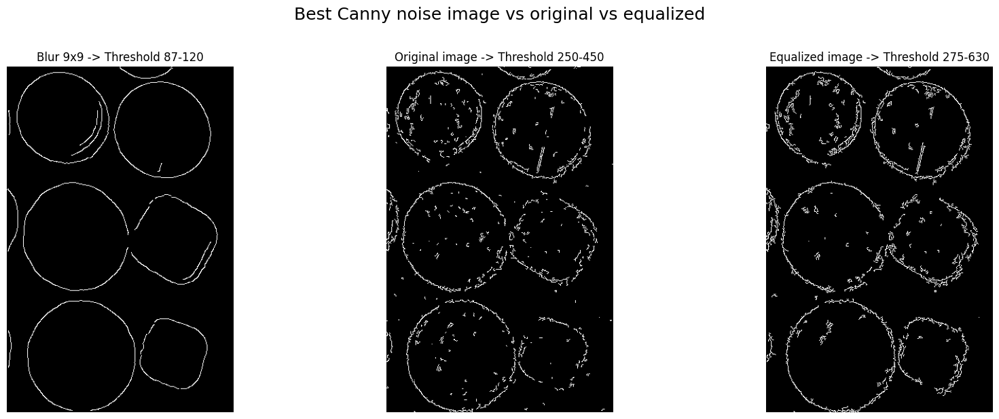

In [14]:
canny_coins_equalized = cv2.Canny(coins_equalized, 275, 630)
plot_horizontal_comparison(
    canny_blur_9x9,
    canny_no_blur,
    canny_coins_equalized,
    "Best Canny noise image vs original vs equalized",
    [
        "Blur 9x9 -> Threshold 87-120",
        "Original image -> Threshold 250-450",
        "Equalized image -> Threshold 275-630",
    ],
)

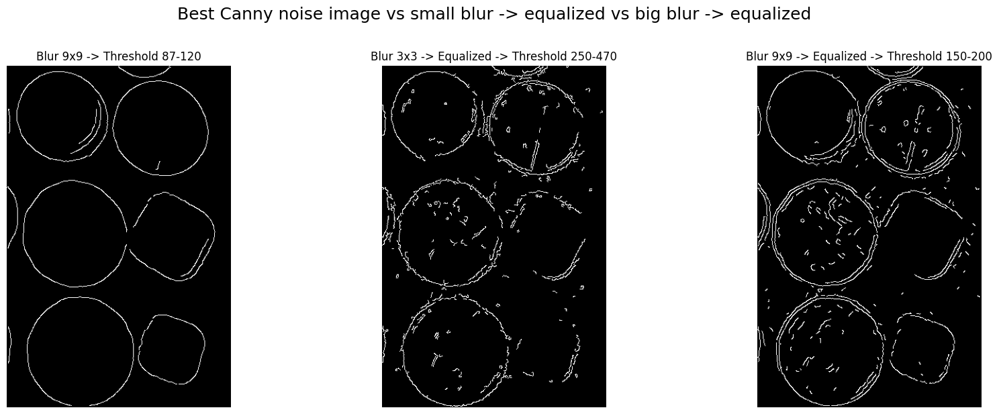

In [15]:
canny_coins_blured_3x3_equalized = cv2.Canny(coins_blured_3x3_equalized, 250, 470)
canny_coins_blured_9x9_equalized = cv2.Canny(coins_blured_9x9_equalized, 150, 200)
plot_horizontal_comparison(
    canny_blur_9x9,
    canny_coins_blured_3x3_equalized,
    canny_coins_blured_9x9_equalized,
    "Best Canny noise image vs small blur -> equalized vs big blur -> equalized",
    [
        "Blur 9x9 -> Threshold 87-120",
        "Blur 3x3 -> Equalized -> Threshold 250-470",
        "Blur 9x9 -> Equalized -> Threshold 150-200",
    ],
)

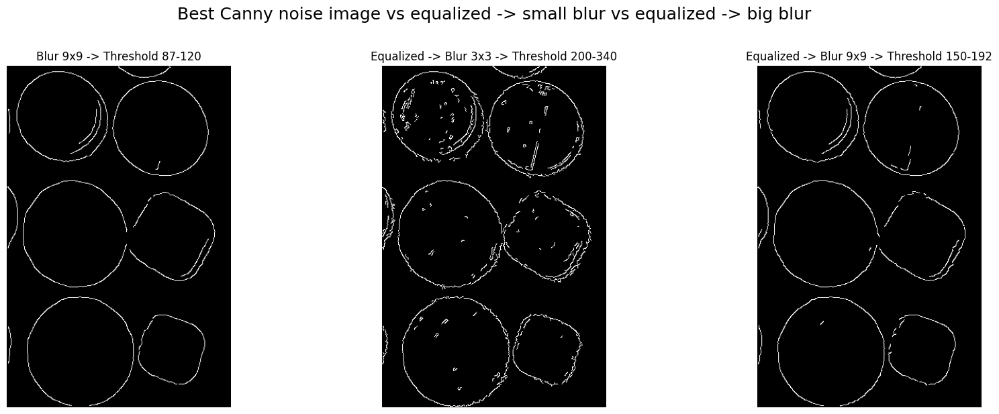

In [16]:
canny_coins_equalized_blured_3x3 = cv2.Canny(
    cv2.GaussianBlur(coins_equalized, (3, 3), 0), 200, 340
)
canny_coins_equalized_blured_9x9 = cv2.Canny(
    cv2.GaussianBlur(coins_equalized, (9, 9), 0), 150, 192
)
plot_horizontal_comparison(
    canny_blur_9x9,
    canny_coins_equalized_blured_3x3,
    canny_coins_equalized_blured_9x9,
    "Best Canny noise image vs equalized -> small blur vs equalized -> big blur",
    [
        "Blur 9x9 -> Threshold 87-120",
        "Equalized -> Blur 3x3 -> Threshold 200-340",
        "Equalized -> Blur 9x9 -> Threshold 150-192",
    ],
)

---

##### Zad. 4: Transformacja do rozkładu docelowego

Dla obrazów `hare_gray` (od tego zacznij) i `hare_roi` wykonaj transformację do wybranego (założonego przez siebie) rozkładu docelowego, tak aby zmaksymalizować możliwość wyodrębnienia obiektu z otoczenia (zająca) przy użyciu algorytmu binaryzacji Otsu. Zbadaj wpływ kształtu rozkładu docelowego na zachowanie transformacji.  
Jaki(e) parametr(y) rozkładu są najistotniejsze?

Podpowiedź: przedstawiona we wstępie teoretycznym transformacja obu rozkładów (źródłowego i docelowego) do rozkładu jednostajnego _nie musi_ zostać faktycznie wykonana (dlatego nie używaj w zadaniu funkcji `cv2.equalizeHist`)! Wystarczy porównywanie ze sobą wartości ze skumulowanych rozkładów (rysunek 3).

Podpowiedź 2: [`cv2.LUT`](https://docs.opencv.org/4.5.3/d2/de8/group__core__array.html#gab55b8d062b7f5587720ede032d34156f)

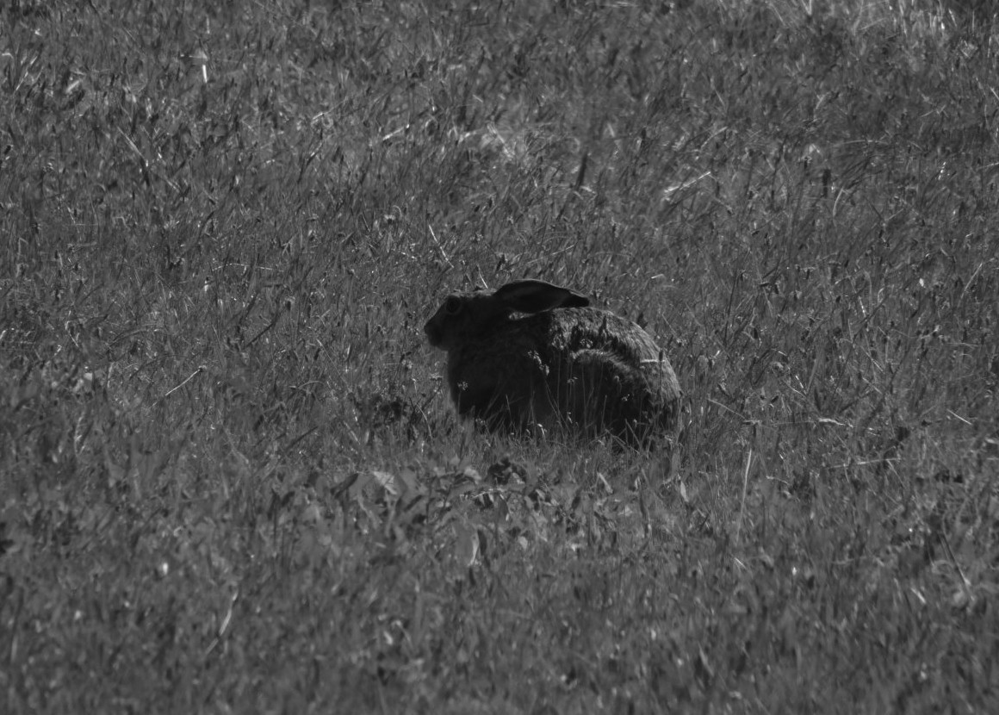

In [3]:
hare_gray = cv2.imread("dane/Zajac.jpg", cv2.IMREAD_GRAYSCALE)
Image.fromarray(hare_gray)

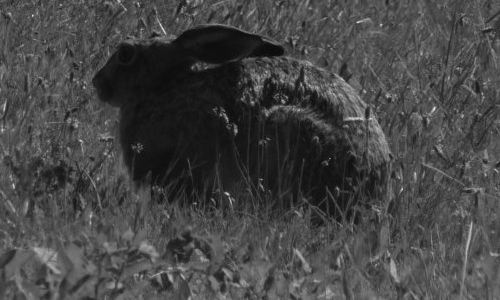

In [4]:
hare_roi = hare_gray[300:600, 400:900].copy()
Image.fromarray(hare_roi)

Rozwiązanie:

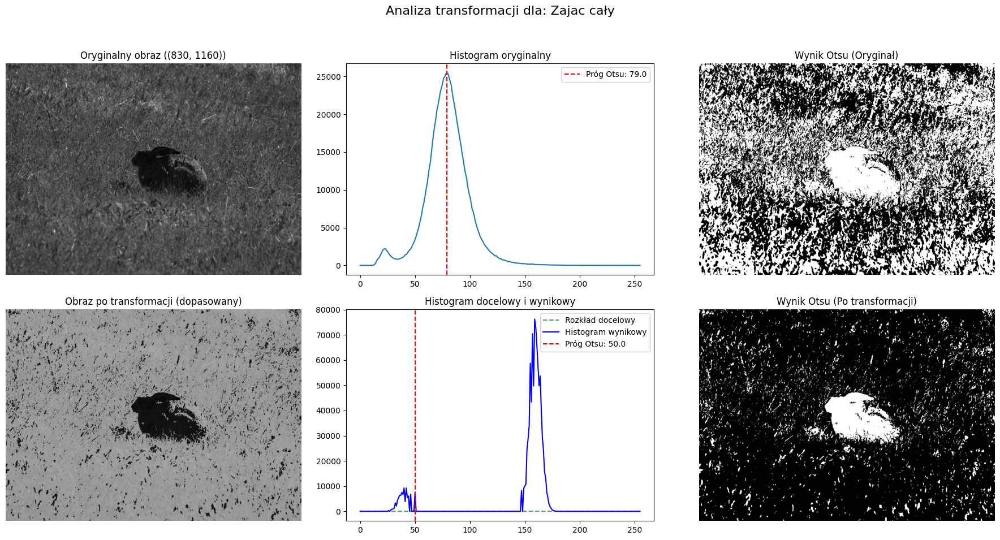

In [ ]:
x = np.arange(256)

mean1, std1, weight1 = 10, 7, 0.1
gauss1 = weight1 * np.exp(-((x - mean1) ** 2) / (2 * std1**2))

mean2, std2, weight2 = 200, 30, 0.9
gauss2 = weight2 * np.exp(-((x - mean2) ** 2) / (2 * std2**2))

target_bimodal_hist = gauss1 + gauss2
target_bimodal_hist += 1e-6

analyze_otsu_transformation(hare_gray, "Zajac cały", target_bimodal_hist)

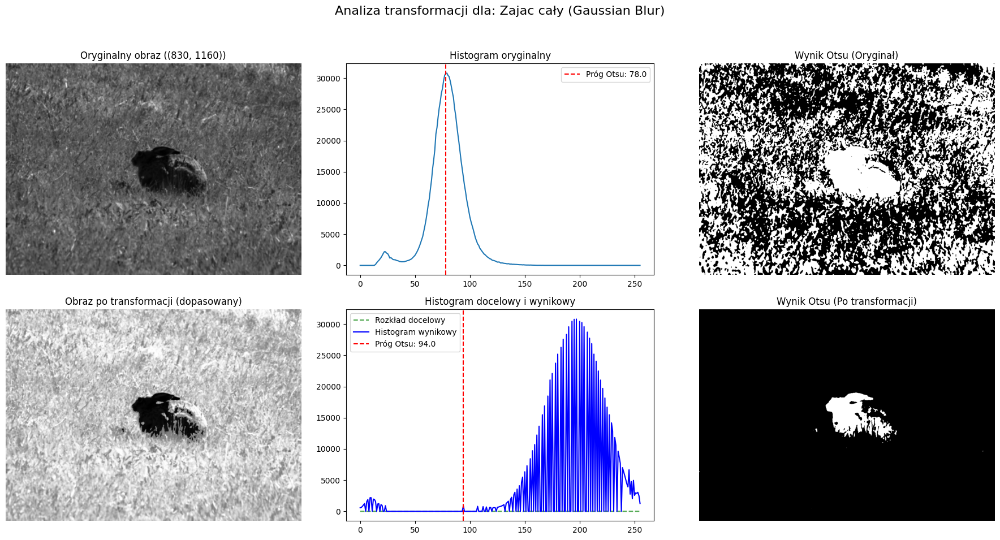

In [9]:
x = np.arange(256)

mean1, std1, weight1 = 10, 7, 0.1
gauss1 = weight1 * np.exp(-((x - mean1) ** 2) / (2 * std1**2))

mean2, std2, weight2 = 200, 30, 0.9
gauss2 = weight2 * np.exp(-((x - mean2) ** 2) / (2 * std2**2))

target_bimodal_hist = gauss1 + gauss2
target_bimodal_hist += 1e-6

blured_hare_gray = cv2.GaussianBlur(hare_gray, (7, 7), 0)
analyze_otsu_transformation(
    blured_hare_gray, "Zajac cały (Gaussian Blur)", target_bimodal_hist
)

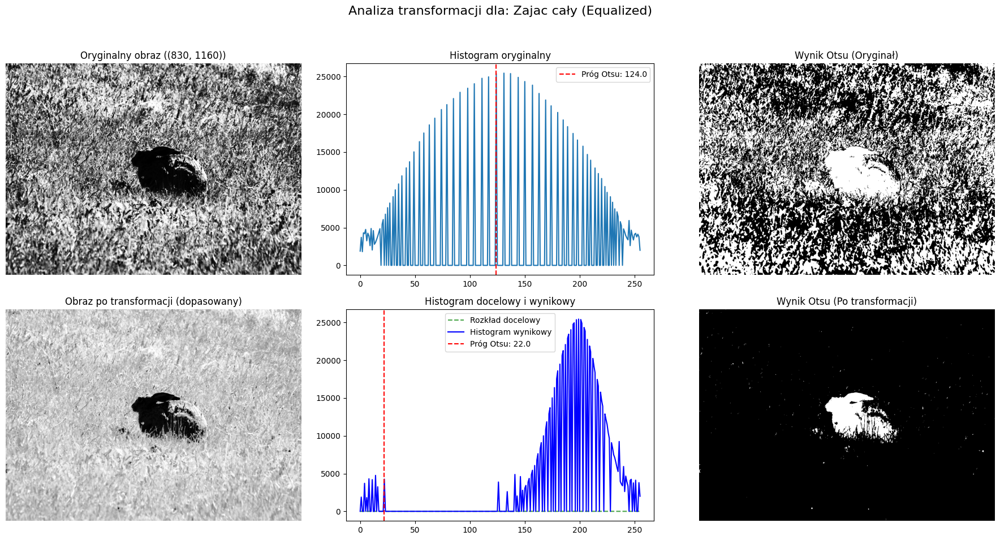

In [12]:
x = np.arange(256)

mean1, std1, weight1 = 10, 8, 0.1
gauss1 = weight1 * np.exp(-((x - mean1) ** 2) / (2 * std1**2))

mean2, std2, weight2 = 200, 25, 0.9
gauss2 = weight2 * np.exp(-((x - mean2) ** 2) / (2 * std2**2))

target_bimodal_hist = gauss1 + gauss2
target_bimodal_hist += 1e-6

equalized_hare_gray = cv2.equalizeHist(hare_gray)
analyze_otsu_transformation(
    equalized_hare_gray, "Zajac cały (Equalized)", target_bimodal_hist
)

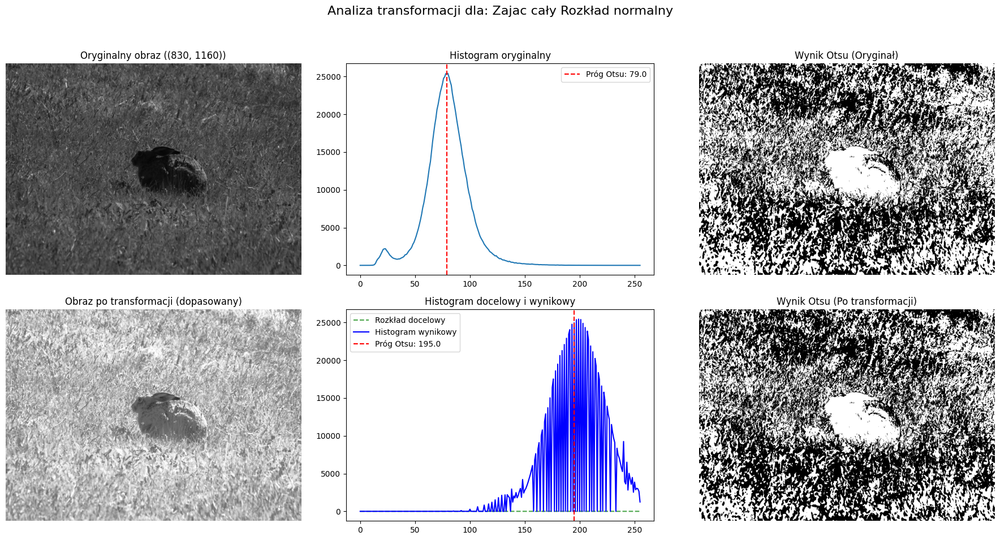

In [16]:
x = np.arange(256)

mean1, std1 = 200, 30
target_normal_hist = np.exp(-((x - mean1) ** 2) / (2 * std1**2))

target_normal_hist += 1e-6

analyze_otsu_transformation(
    hare_gray, "Zajac cały Rozkład normalny", target_normal_hist
)

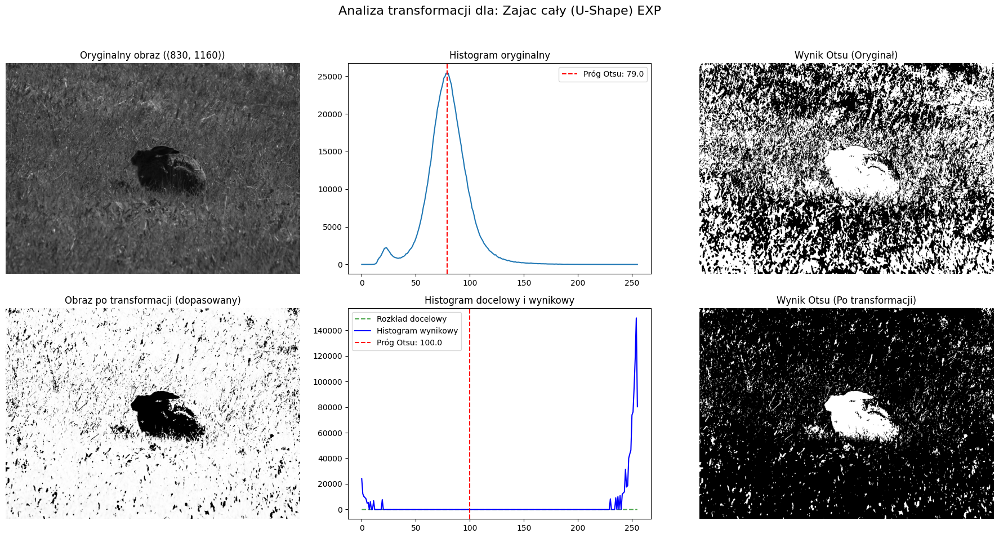

In [29]:
x = np.arange(256)
tau = 5
exp1 = np.exp(-x / tau) * 0.1
exp2 = np.exp(-(255 - x) / tau) * 0.9

target_U_shape_hist = exp1 + exp2
target_U_shape_hist += 1e-6

analyze_otsu_transformation(
    hare_gray, "Zajac cały (U-Shape) EXP", target_U_shape_hist, 100
)

## ROI

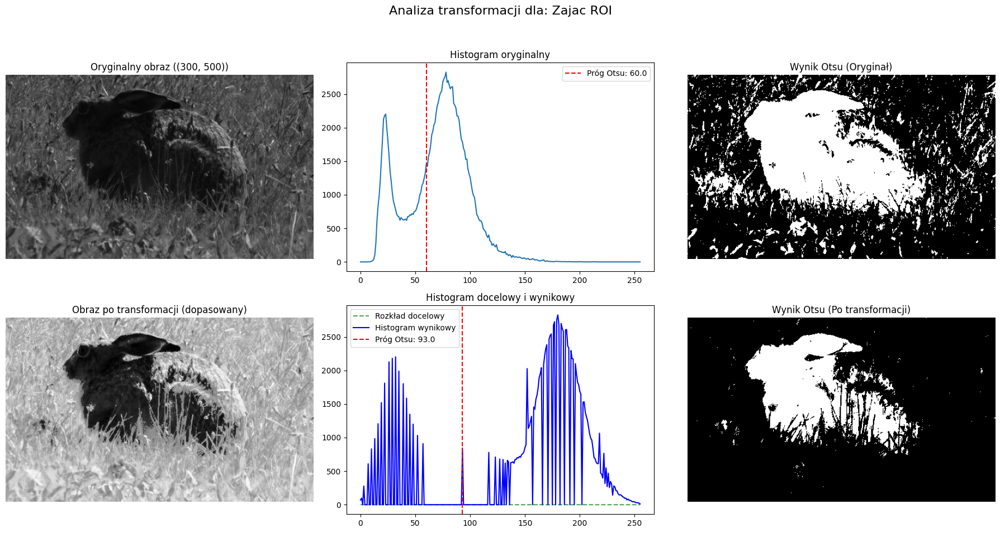

In [48]:
x = np.arange(256)
mean1, std1, weight1 = 30, 15, 0.25
gauss1 = weight1 * np.exp(-((x - mean1) ** 2) / (2 * std1**2))

mean2, std2, weight2 = 180, 25, 0.75
gauss2 = weight2 * np.exp(-((x - mean2) ** 2) / (2 * std2**2))


target_bimodal_hist = gauss1 + gauss2
target_bimodal_hist += 1e-6
analyze_otsu_transformation(hare_roi, "Zajac ROI", target_bimodal_hist)

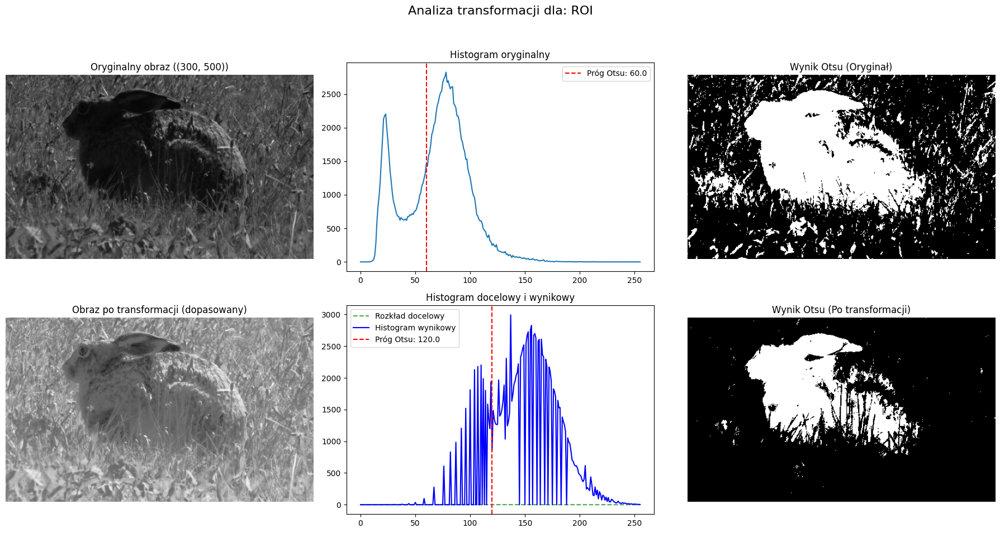

In [17]:
x = np.arange(256)

mean1, std1 = 150, 30
target_normal_hist = np.exp(-((x - mean1) ** 2) / (2 * std1**2))

target_normal_hist += 1e-6

analyze_otsu_transformation(hare_roi, "ROI", target_normal_hist, 120)